In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from utils.CaImageCSV import CaImageCSV
from context_data_csv import ContextDataCSV
from matrix_optimizer import MatrixOptimizer
import utils.sulfur.constant as const

from utils.TimeCorrelationCalculator import TimeCorrelationCalculator
from utils.TimeCorrelationViewer import TimeCorrelationViewer

In [2]:
def calculate_cell_correlation(df, frame_index, size=9):
    sliding_window = df.iloc[frame_index:frame_index+size, :]
    return sliding_window.corr()

In [3]:
def calc_time_correlation(seconds, correlation_for_time, correlation_for_cells):
    for i in range(seconds):
        i_time_data = correlation_for_cells[i]
        for j in range(seconds):
            j_time_data = correlation_for_cells[j]

            if correlation_for_time.at[j, i] is not np.nan:
                correlation_for_time.at[i, j] = correlation_for_time.at[j, i]
                continue

            cell_count = len(i_time_data)
            calculated_values = i_time_data * j_time_data
            corr_sum = (calculated_values - (calculated_values * np.eye(len(calculated_values)))).sum().sum()
            if correlation_for_time.at[i, j] is np.nan:
                correlation_for_time.at[i, j] = 0.0
            correlation_for_time.at[i, j] += corr_sum / (cell_count * (cell_count - 1))

In [4]:
def view_between_es_correlation(animal_name, context_name):
    A1preES_context_csv = ContextDataCSV(animal_name, '%spreES' % context_name)
    A1preES_context_data = A1preES_context_csv.data_frame
    A1postES_context_csv = ContextDataCSV(animal_name, '%spostES' % context_name)
    A1postES_context_data = A1postES_context_csv.data_frame
    
    between_context_df = pd.DataFrame(columns=A1preES_context_data.columns)
    between_context_df = between_context_df.append(A1preES_context_data.iloc[2601:3001, :], ignore_index=True)
    between_context_df = between_context_df.append(A1postES_context_data.iloc[0:400, :], ignore_index=True)
    between_context_df
    
    calculator = TimeCorrelationCalculator(animal_name, context_name, data_frame=between_context_df, engram_cells=A1preES_context_csv.engram_cells(), non_engram_cells=A1preES_context_csv.non_engram_cells())
    result = calculator.calc(start=0, end=80)
    TimeCorrelationViewer(*result, ticks_span=10).draw(title='%spreES-%spostES in %s' % (context_name, context_name, animal_name))
    
    return result

In [5]:
def ratio_of_sum_correlation(df, title):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_title(title)
    
    means = df.mean()
    errors = df.sem()
    x = np.arange(0, 3.1, 1.5)
    ax.bar(x=0.0, height=means['non-engram cells'], label='non-engram cells', yerr=errors['non-engram cells'], capsize=2, align='center', color='green')
    ax.bar(x=1.5, height=means['engram cells'], label='engram cells', yerr=errors['engram cells'], capsize=2, align='center', color='orange')
    ax.bar(x=3.0, height=means['shuffle cells'], label='shuffle cells', yerr=errors['shuffle cells'], capsize=2, align='center', color='royalblue')
    ax.set_xticks(x)
    ax.set_xticklabels(labels=['non-engram cells', 'engram cells', 'shuffle cells'], fontsize=20)
    ax.set_ylabel('ratio of sum all correlation', fontsize=20)
    
    for index, row in df.iterrows():
        engram_value = row[1]
        non_engram_value = row[2]
        shuffle_value = row[0]
        ax.plot(np.array([0.5, 1.0]), np.array([non_engram_value, engram_value]), marker='x', color='grey')
        ax.plot(np.array([2.0, 2.5]), np.array([engram_value, shuffle_value]), marker='x', color='grey')
    fig.show()

CPU times: user 1h 13min 26s, sys: 20.5 s, total: 1h 13min 46s
Wall time: 1h 11min 49s


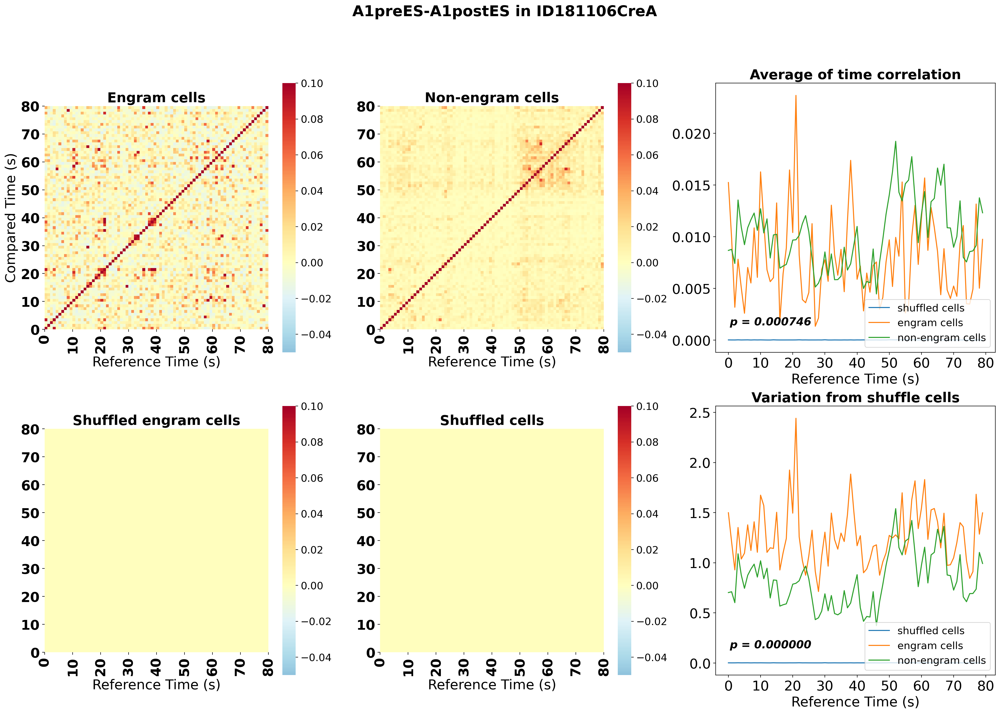

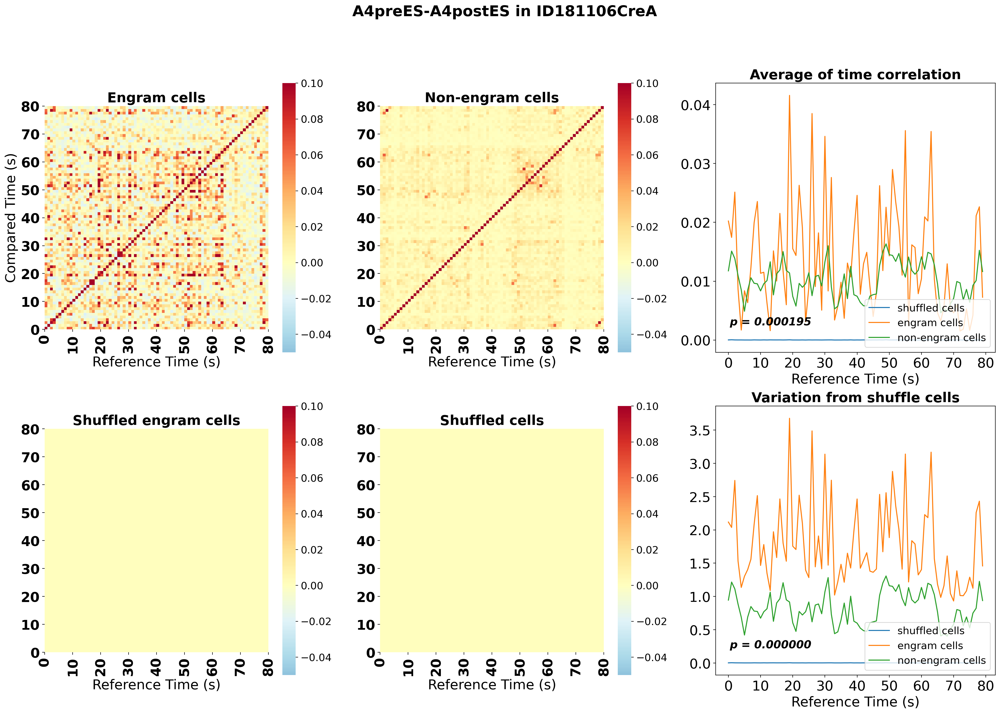

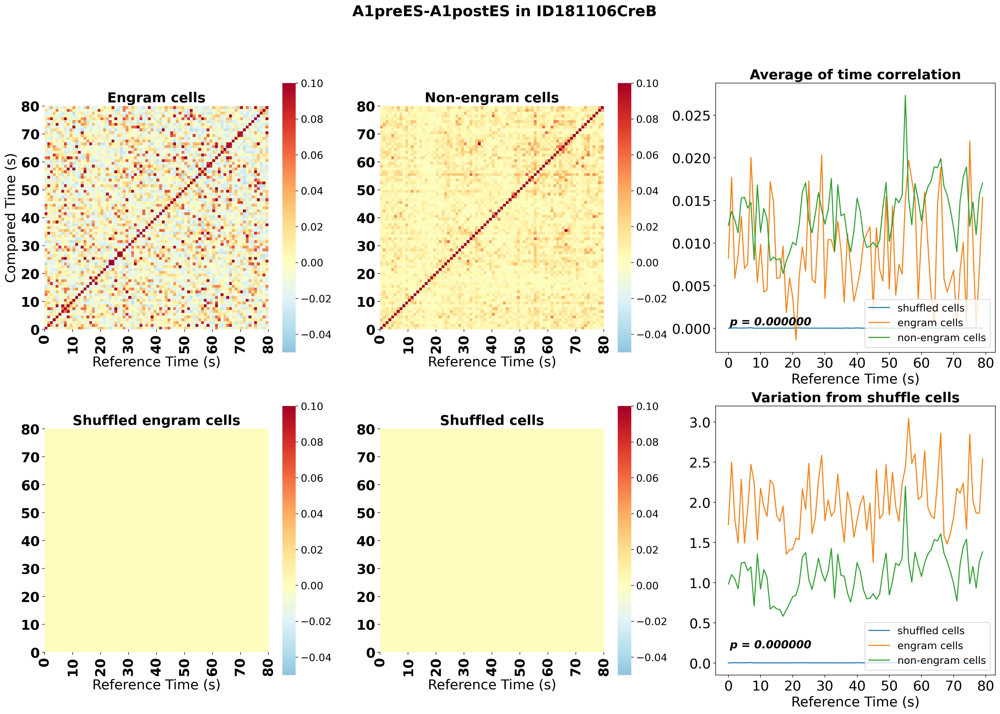

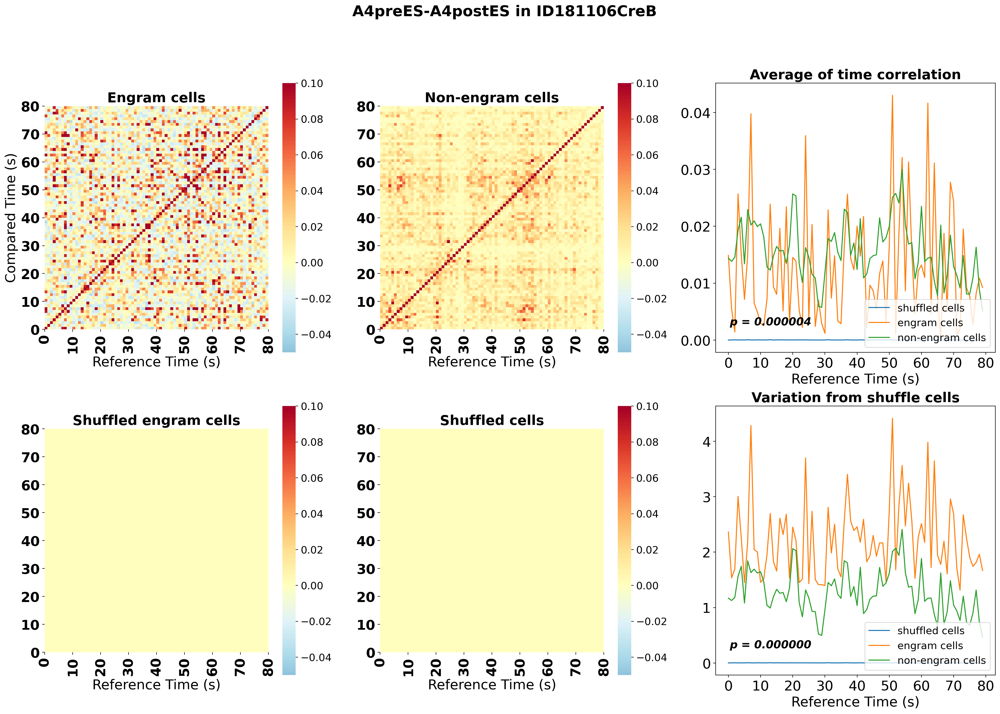

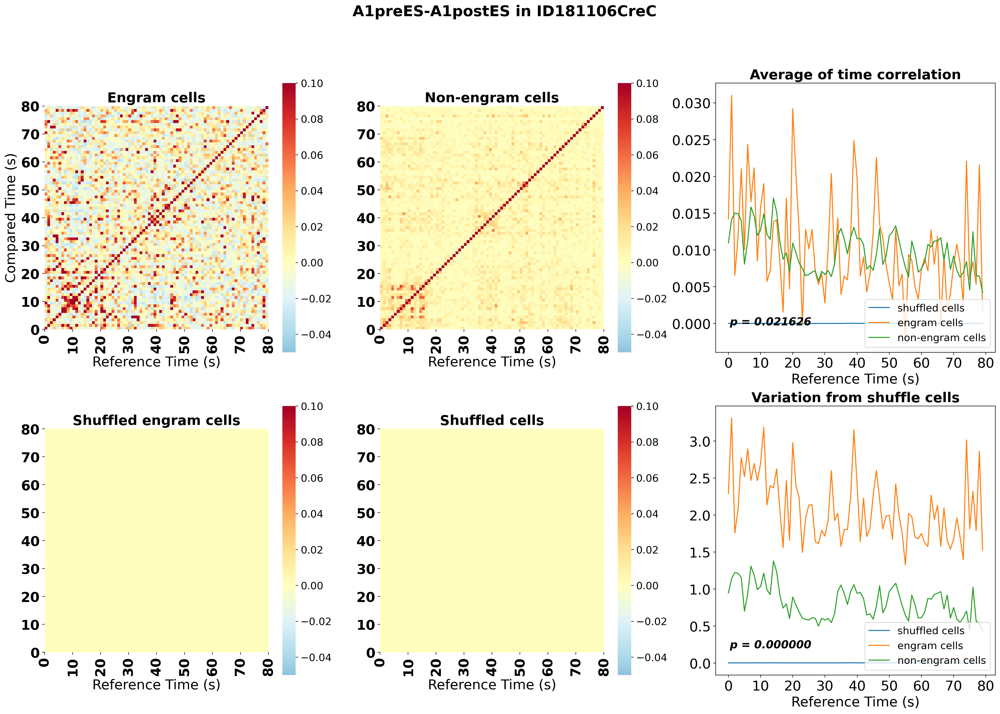

...

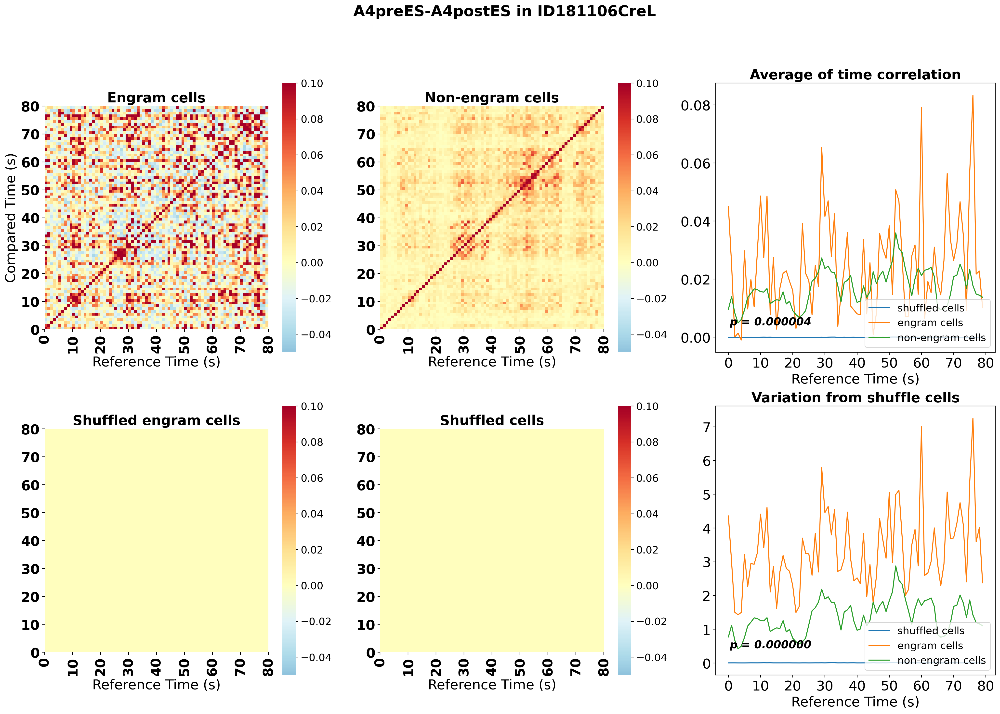

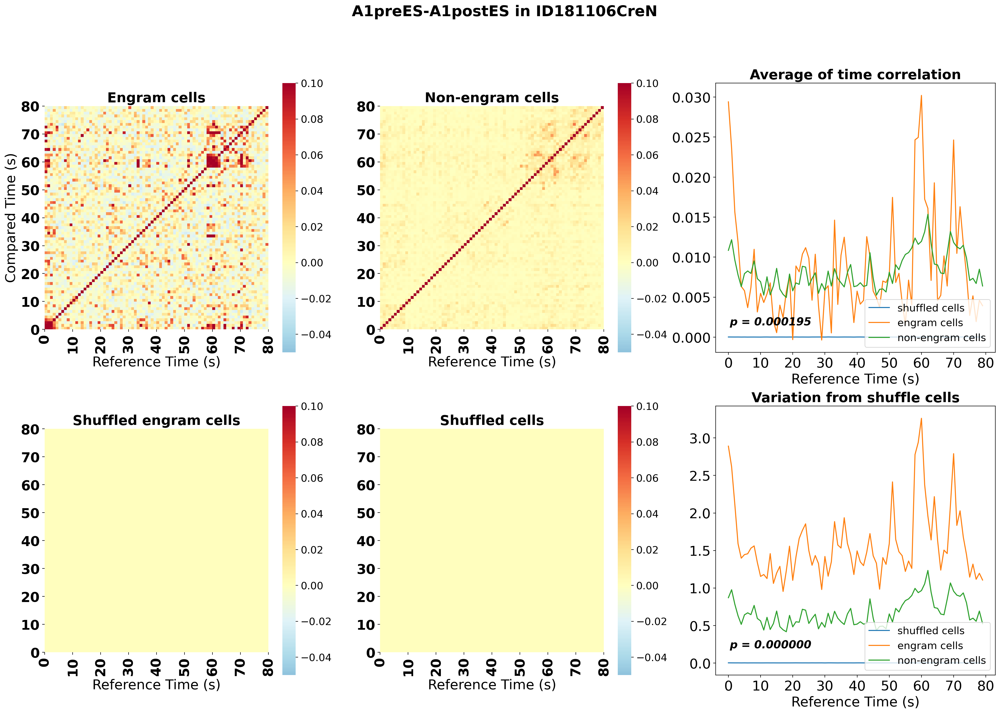

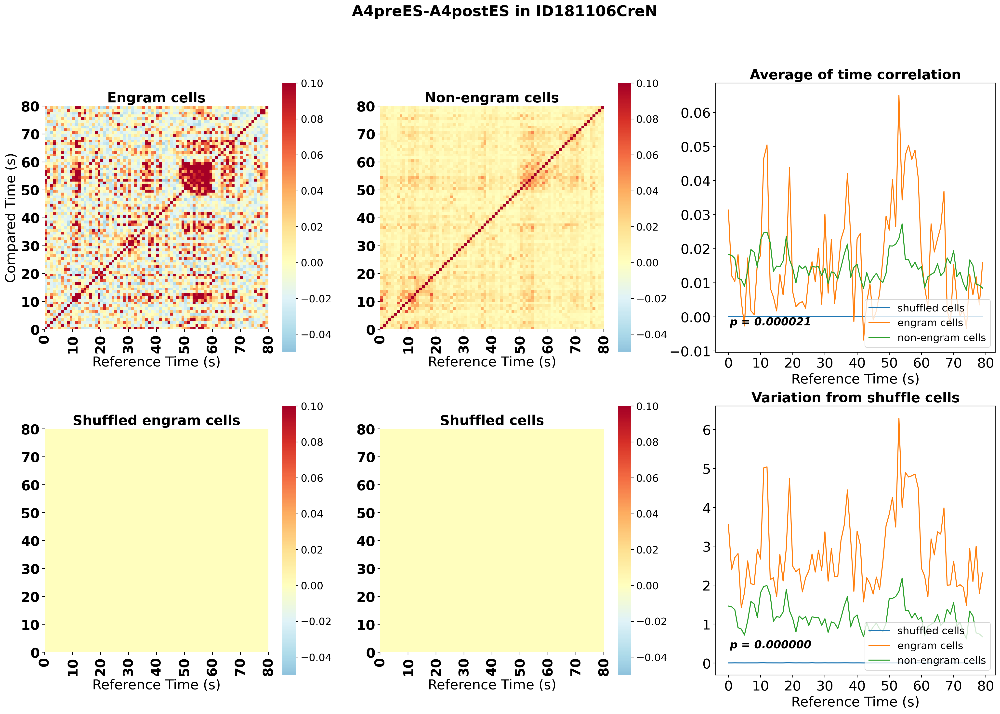

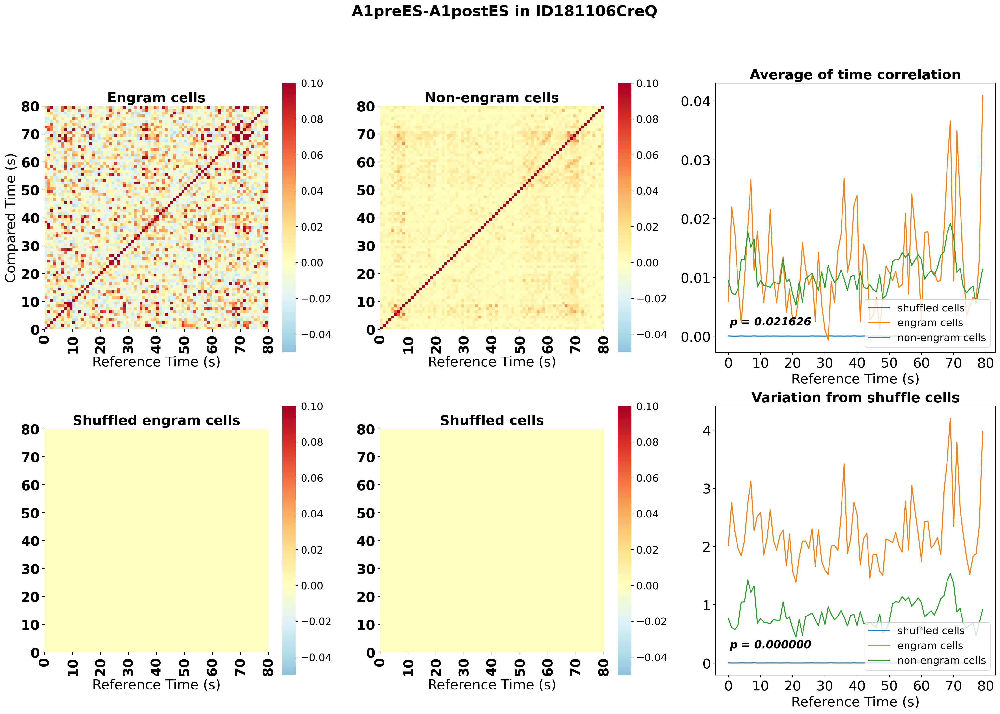

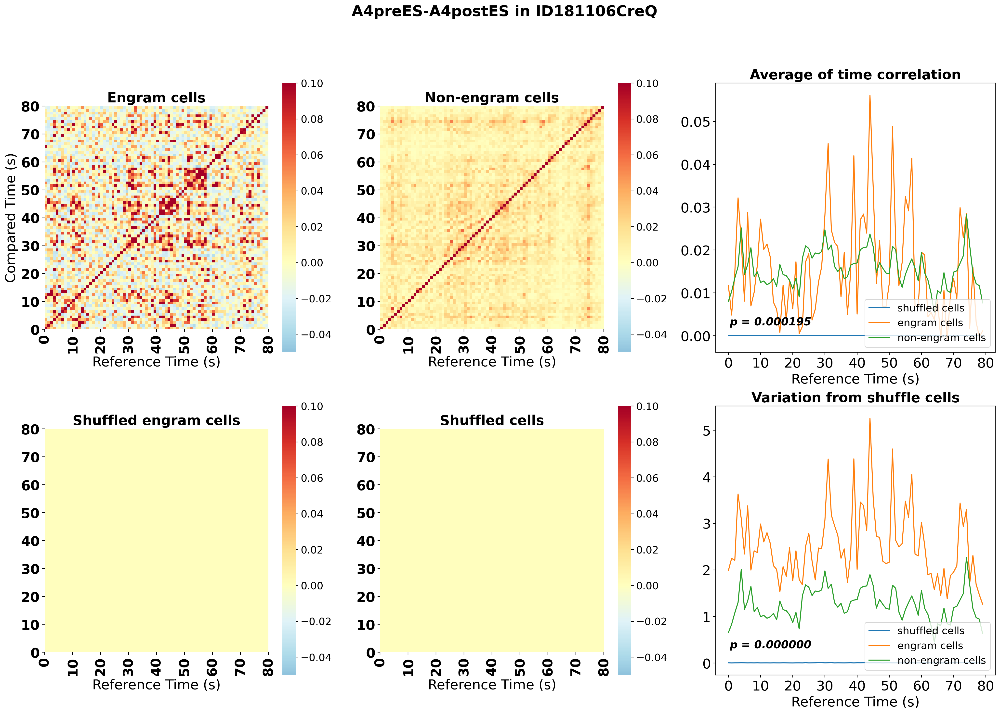

In [6]:
%%time

abs_sum_df_for_a1 = pd.DataFrame(0.0, columns=['shuffle cells', 'engram cells', 'non-engram cells'], index=const.ANIMAL_NAMES)
abs_sum_df_for_a4 = pd.DataFrame(0.0, columns=['shuffle cells', 'engram cells', 'non-engram cells'], index=const.ANIMAL_NAMES)

for animal_name in const.ANIMAL_NAMES:
    shuffle_df, _, engram_df, non_engram_df = view_between_es_correlation(animal_name, 'A1')
    abs_sum_df_for_a1.loc[animal_name, 'shuffle cells']    = shuffle_df.abs().sum().mean()
    abs_sum_df_for_a1.loc[animal_name, 'engram cells']     = engram_df.abs().sum().mean()
    abs_sum_df_for_a1.loc[animal_name, 'non-engram cells'] = non_engram_df.abs().sum().mean()
    
    shuffle_df, _, engram_df, non_engram_df = result = view_between_es_correlation(animal_name, 'A4')
    abs_sum_df_for_a4.loc[animal_name, 'shuffle cells']    = shuffle_df.abs().sum().mean()
    abs_sum_df_for_a4.loc[animal_name, 'engram cells']     = engram_df.abs().sum().mean()
    abs_sum_df_for_a4.loc[animal_name, 'non-engram cells'] = non_engram_df.abs().sum().mean()

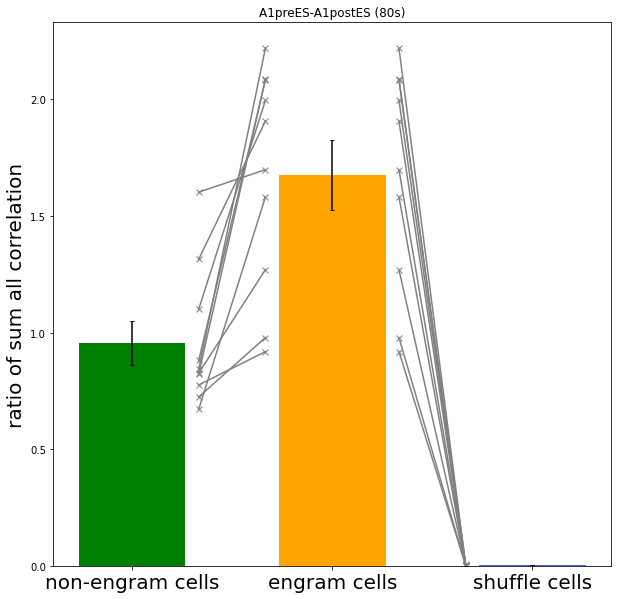

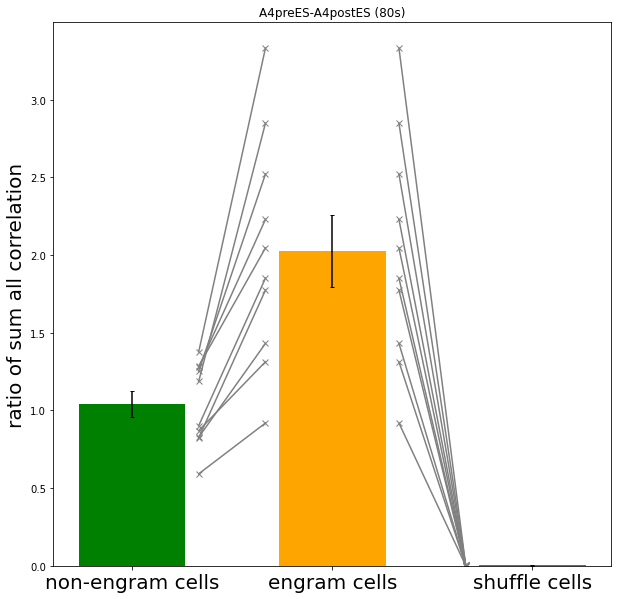

In [7]:
ratio_of_sum_correlation(abs_sum_df_for_a1, 'A1preES-A1postES (80s)')
ratio_of_sum_correlation(abs_sum_df_for_a4, 'A4preES-A4postES (80s)')